# Imports

In [1]:
import os, random, cv2, gc, torch, timm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
import torch.nn.functional as F
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, WeightedRandomSampler
from torchvision import datasets
from PIL import Image
from sklearn.metrics import cohen_kappa_score, classification_report, confusion_matrix, accuracy_score, balanced_accuracy_score
import seaborn as sns


/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

# Hyperparameter and Environment Configuration

In [2]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
TRAIN_DIR = "/kaggle/input/dr-clean-bengraham-512/train"
VAL_DIR = "/kaggle/input/dr-clean-bengraham-512/val"

BATCH_SIZE = 32
ACCUM_STEPS = 2
EPOCHS = 30  
LR = 1.5e-4    
MIN_LR = 5e-6
WEIGHT_DECAY = 1e-4
WARM_UP = 3
PATIENCE = 7


---
# Data Preparation
---

### Data Pipeline & Augmentation

In [3]:

class AlbumentationsDataset(datasets.ImageFolder):
    def __getitem__(self, index):
        path, target = self.samples[index]
        sample = cv2.imread(path)
        sample = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)
        if self.transform is not None:
            transformed = self.transform(image=sample)
            sample = transformed['image']
        return sample, target

train_transform = A.Compose([
    A.RandomResizedCrop(size=(512, 512), scale=(0.8, 1.0), p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5, border_mode=cv2.BORDER_REFLECT_101),
    A.RandomGamma(gamma_limit=(85, 115), p=0.3),
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.3),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(512, 512), 
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

train_dataset = AlbumentationsDataset(TRAIN_DIR, transform=train_transform)
val_dataset = AlbumentationsDataset(VAL_DIR, transform=val_transform)


### Class Balancing Using Weighted Sampler

In [4]:

# Sampler for balance
class_counts = np.bincount(train_dataset.targets)
class_weights = 1.0 / torch.sqrt(torch.tensor(class_counts, dtype=torch.float))
sample_weights = [class_weights[t] for t in train_dataset.targets]
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)


---
# Model & Training
---

### Model Architecture (CORAL Ordinal Head)

In [5]:
class ResidualBlock(nn.Module):
    def __init__(self, in_ch, out_ch, stride=1): 
        super().__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_ch)
        
        self.shortcut = nn.Sequential()
        if stride != 1 or in_ch != out_ch:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 1, stride=stride, bias=False),
                nn.BatchNorm2d(out_ch)
            )

    def forward(self, x):
        identity = self.shortcut(x)
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += identity
        return F.relu(out)

class CustomDRModel(nn.Module):
    def __init__(self, num_classes=5):
        super().__init__()
        self.stem = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        )

        self.layer1 = nn.Sequential(ResidualBlock(64, 64), ResidualBlock(64, 64))
        self.layer2 = nn.Sequential(ResidualBlock(64, 128, stride=2), ResidualBlock(128, 128))
        self.layer3 = nn.Sequential(ResidualBlock(128, 256, stride=2), ResidualBlock(256, 256))
        self.layer4 = nn.Sequential(ResidualBlock(256, 512, stride=1), ResidualBlock(512, 512))

        self.gap = nn.AdaptiveAvgPool2d(1)
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 1024),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(1024, num_classes - 1) 
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.gap(x)
        return self.classifier(x)
        
# CORAL LOGIC 
def label_to_ordinal(labels, num_classes=5):
    levels = torch.arange(num_classes - 1).to(labels.device)
    return (labels.unsqueeze(1) > levels).float()

def ordinal_to_label(logits):
    probs = torch.sigmoid(logits)
    return (probs > 0.50).sum(dim=1)



### Loss Function & Optimization

In [6]:
model = CustomDRModel(num_classes=5).to(DEVICE) 
gate_weights = torch.tensor([1.0, 1.1, 1.4, 1.8], device=DEVICE)
criterion = nn.BCEWithLogitsLoss(reduction='none') 
optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS - WARM_UP, eta_min=MIN_LR)
scaler = torch.amp.GradScaler()

### Training Loop with Warmup

In [7]:
best_kappa = -1.0
early_stop_counter = 0  
history = [] 

for epoch in range(EPOCHS):
    # Linear Warmup
    if epoch < WARM_UP:
        curr_lr = LR * (epoch + 1) / WARM_UP
        for param_group in optimizer.param_groups:
            param_group['lr'] = curr_lr
        
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS}") 
    
    optimizer.zero_grad()
    for i, (images, labels) in enumerate(pbar):
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        
        with torch.amp.autocast(device_type=DEVICE.type):
            outputs = model(images)
            targets_ord = label_to_ordinal(labels)
            # Calculate raw per-gate loss
            raw_loss = criterion(outputs, targets_ord)
            # Apply clinical weights with explicit broadcasting
            weighted_loss = (raw_loss * gate_weights.unsqueeze(0)).mean()
            loss = weighted_loss / ACCUM_STEPS
            
        scaler.scale(loss).backward()
                
        if (i + 1) % ACCUM_STEPS == 0:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0) 
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
            
        running_loss += loss.item() * ACCUM_STEPS
        train_preds = ordinal_to_label(outputs)
        correct += (train_preds == labels).sum().item()
        total += labels.size(0)
        pbar.set_postfix({'loss': f"{running_loss/(i+1):.4f}", 'acc': f"{correct/total:.4f}"})

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = correct / total

    # VALIDATION 
    model.eval()
    all_preds, all_labs = [], []
    val_correct, val_total = 0, 0  
    val_running_loss = 0.0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            targets_ord = label_to_ordinal(labels)
            
            with torch.amp.autocast(device_type=DEVICE.type):
                outputs = model(images) 
                
                raw_loss_val = criterion(outputs, targets_ord)
                loss_val = (raw_loss_val * gate_weights.unsqueeze(0)).mean()
                
                val_running_loss += loss_val.item() * images.size(0) 
                val_preds = ordinal_to_label(outputs)
            
            all_preds.extend(val_preds.cpu().numpy())
            all_labs.extend(labels.cpu().numpy())
            val_correct += (val_preds == labels).sum().item()  
            val_total += labels.size(0)

    # CALCULATE FINAL METRICS
    val_loss = val_running_loss / val_total
    val_acc = val_correct / val_total
    bal_acc = balanced_accuracy_score(all_labs, all_preds)
    val_kappa = cohen_kappa_score(all_labs, all_preds, weights='quadratic')

    # History
    history.append({
        'epoch': epoch + 1,
        'train_loss': epoch_loss,
        'val_loss': val_loss,
        'train_acc': epoch_acc,
        'val_acc': val_acc,  
        'val_kappa': val_kappa,
        'val_bal_acc': bal_acc
    })
    
    print(f"\n[EPOCH {epoch+1}] Train Loss: {epoch_loss:.4f} | Val Loss: {val_loss:.4f}")
    print(f"Train Acc: {epoch_acc:.4f} | Val Acc: {val_acc:.4f} | Kappa: {val_kappa:.4f}")
    print(f"Balanced Val Acc: {bal_acc:.4f}")

    # Per-Class Recall Check
    report = classification_report(
        all_labs, 
        all_preds, 
        target_names=train_dataset.classes, 
        output_dict=True, 
        zero_division=0
    )

    recall_str = " | ".join([f"C{k} Rec: {report[str(k)]['recall']:.3f}" for k in range(len(train_dataset.classes))])
    print(f"Recall: {recall_str}")
    
    current_lr = optimizer.param_groups[0]['lr']
    print(f"Current LR: {current_lr:.2e}")
    
    # MODEL SAVING & EARLY STOPPING
    if val_kappa > best_kappa:
        best_kappa = val_kappa
        torch.save(model.state_dict(), "best_custom_dr_model.pth")
        print(f"New Best Kappa! Saved.")
        early_stop_counter = 0
    else:
        early_stop_counter += 1
        print(f"No improvement. Patience: {early_stop_counter}/{PATIENCE}")

    if early_stop_counter >= PATIENCE:
        print(f"Early Stopping triggered at Epoch {epoch+1}")
        break

    # SCHEDULER STEP
    if epoch >= WARM_UP:
        scheduler.step()

        
    gc.collect()
    torch.cuda.empty_cache()

Epoch 1/30: 100%|██████████| 452/452 [02:27<00:00,  3.06it/s, loss=0.6041, acc=0.2782]



[EPOCH 1] Train Loss: 0.6041 | Val Loss: 0.4567
Train Acc: 0.2782 | Val Acc: 0.4411 | Kappa: 0.3311
Balanced Val Acc: 0.3172
Recall: C0 Rec: 0.483 | C1 Rec: 0.325 | C2 Rec: 0.359 | C3 Rec: 0.200 | C4 Rec: 0.218
Current LR: 5.00e-05
New Best Kappa! Saved.


Epoch 2/30: 100%|██████████| 452/452 [02:24<00:00,  3.13it/s, loss=0.5350, acc=0.3524]



[EPOCH 2] Train Loss: 0.5350 | Val Loss: 0.4937
Train Acc: 0.3524 | Val Acc: 0.2774 | Kappa: 0.3230
Balanced Val Acc: 0.3795
Recall: C0 Rec: 0.212 | C1 Rec: 0.497 | C2 Rec: 0.465 | C3 Rec: 0.463 | C4 Rec: 0.261
Current LR: 1.00e-04
No improvement. Patience: 1/7


Epoch 3/30: 100%|██████████| 452/452 [02:21<00:00,  3.18it/s, loss=0.4998, acc=0.3882]



[EPOCH 3] Train Loss: 0.4998 | Val Loss: 0.3969
Train Acc: 0.3882 | Val Acc: 0.4483 | Kappa: 0.4283
Balanced Val Acc: 0.3730
Recall: C0 Rec: 0.466 | C1 Rec: 0.421 | C2 Rec: 0.425 | C3 Rec: 0.320 | C4 Rec: 0.232
Current LR: 1.50e-04
New Best Kappa! Saved.


Epoch 4/30: 100%|██████████| 452/452 [02:26<00:00,  3.09it/s, loss=0.4649, acc=0.4217]



[EPOCH 4] Train Loss: 0.4649 | Val Loss: 0.3956
Train Acc: 0.4217 | Val Acc: 0.4614 | Kappa: 0.4847
Balanced Val Acc: 0.4480
Recall: C0 Rec: 0.485 | C1 Rec: 0.401 | C2 Rec: 0.364 | C3 Rec: 0.497 | C4 Rec: 0.493
Current LR: 1.50e-04
New Best Kappa! Saved.


Epoch 5/30: 100%|██████████| 452/452 [02:21<00:00,  3.20it/s, loss=0.4449, acc=0.4462]



[EPOCH 5] Train Loss: 0.4449 | Val Loss: 0.3841
Train Acc: 0.4462 | Val Acc: 0.5941 | Kappa: 0.5084
Balanced Val Acc: 0.4722
Recall: C0 Rec: 0.690 | C1 Rec: 0.204 | C2 Rec: 0.312 | C3 Rec: 0.606 | C4 Rec: 0.549
Current LR: 1.50e-04
New Best Kappa! Saved.


Epoch 6/30: 100%|██████████| 452/452 [02:21<00:00,  3.19it/s, loss=0.4361, acc=0.4584]



[EPOCH 6] Train Loss: 0.4361 | Val Loss: 0.2787
Train Acc: 0.4584 | Val Acc: 0.7343 | Kappa: 0.5646
Balanced Val Acc: 0.3691
Recall: C0 Rec: 0.931 | C1 Rec: 0.076 | C2 Rec: 0.205 | C3 Rec: 0.303 | C4 Rec: 0.331
Current LR: 1.48e-04
New Best Kappa! Saved.


Epoch 7/30: 100%|██████████| 452/452 [02:20<00:00,  3.21it/s, loss=0.4222, acc=0.4698]



[EPOCH 7] Train Loss: 0.4222 | Val Loss: 0.5438
Train Acc: 0.4698 | Val Acc: 0.2652 | Kappa: 0.3473
Balanced Val Acc: 0.4711
Recall: C0 Rec: 0.183 | C1 Rec: 0.399 | C2 Rec: 0.491 | C3 Rec: 0.663 | C4 Rec: 0.620
Current LR: 1.46e-04
No improvement. Patience: 1/7


Epoch 8/30: 100%|██████████| 452/452 [02:21<00:00,  3.20it/s, loss=0.4113, acc=0.4800]



[EPOCH 8] Train Loss: 0.4113 | Val Loss: 0.3079
Train Acc: 0.4800 | Val Acc: 0.6386 | Kappa: 0.5696
Balanced Val Acc: 0.3948
Recall: C0 Rec: 0.768 | C1 Rec: 0.247 | C2 Rec: 0.274 | C3 Rec: 0.389 | C4 Rec: 0.296
Current LR: 1.42e-04
New Best Kappa! Saved.


Epoch 9/30: 100%|██████████| 452/452 [02:19<00:00,  3.25it/s, loss=0.4051, acc=0.5019]



[EPOCH 9] Train Loss: 0.4051 | Val Loss: 0.2961
Train Acc: 0.5019 | Val Acc: 0.6876 | Kappa: 0.6267
Balanced Val Acc: 0.4775
Recall: C0 Rec: 0.814 | C1 Rec: 0.180 | C2 Rec: 0.357 | C3 Rec: 0.480 | C4 Rec: 0.556
Current LR: 1.38e-04
New Best Kappa! Saved.


Epoch 10/30: 100%|██████████| 452/452 [02:21<00:00,  3.19it/s, loss=0.3957, acc=0.5030]



[EPOCH 10] Train Loss: 0.3957 | Val Loss: 0.2598
Train Acc: 0.5030 | Val Acc: 0.7327 | Kappa: 0.6612
Balanced Val Acc: 0.4145
Recall: C0 Rec: 0.888 | C1 Rec: 0.170 | C2 Rec: 0.351 | C3 Rec: 0.417 | C4 Rec: 0.246
Current LR: 1.33e-04
New Best Kappa! Saved.


Epoch 11/30: 100%|██████████| 452/452 [02:16<00:00,  3.32it/s, loss=0.3867, acc=0.5192]



[EPOCH 11] Train Loss: 0.3867 | Val Loss: 0.2805
Train Acc: 0.5192 | Val Acc: 0.6876 | Kappa: 0.6361
Balanced Val Acc: 0.4740
Recall: C0 Rec: 0.807 | C1 Rec: 0.227 | C2 Rec: 0.384 | C3 Rec: 0.446 | C4 Rec: 0.507
Current LR: 1.27e-04
No improvement. Patience: 1/7


Epoch 12/30: 100%|██████████| 452/452 [02:16<00:00,  3.31it/s, loss=0.3844, acc=0.5221]



[EPOCH 12] Train Loss: 0.3844 | Val Loss: 0.3004
Train Acc: 0.5221 | Val Acc: 0.6426 | Kappa: 0.6236
Balanced Val Acc: 0.4823
Recall: C0 Rec: 0.721 | C1 Rec: 0.290 | C2 Rec: 0.474 | C3 Rec: 0.503 | C4 Rec: 0.423
Current LR: 1.21e-04
No improvement. Patience: 2/7


Epoch 13/30: 100%|██████████| 452/452 [02:16<00:00,  3.31it/s, loss=0.3783, acc=0.5287]



[EPOCH 13] Train Loss: 0.3783 | Val Loss: 0.3424
Train Acc: 0.5287 | Val Acc: 0.5857 | Kappa: 0.6097
Balanced Val Acc: 0.5357
Recall: C0 Rec: 0.639 | C1 Rec: 0.321 | C2 Rec: 0.432 | C3 Rec: 0.674 | C4 Rec: 0.613
Current LR: 1.14e-04
No improvement. Patience: 3/7


Epoch 14/30: 100%|██████████| 452/452 [02:16<00:00,  3.32it/s, loss=0.3752, acc=0.5349]



[EPOCH 14] Train Loss: 0.3752 | Val Loss: 0.2984
Train Acc: 0.5349 | Val Acc: 0.6946 | Kappa: 0.6522
Balanced Val Acc: 0.5263
Recall: C0 Rec: 0.804 | C1 Rec: 0.241 | C2 Rec: 0.399 | C3 Rec: 0.589 | C4 Rec: 0.599
Current LR: 1.06e-04
No improvement. Patience: 4/7


Epoch 15/30: 100%|██████████| 452/452 [02:16<00:00,  3.30it/s, loss=0.3711, acc=0.5355]



[EPOCH 15] Train Loss: 0.3711 | Val Loss: 0.2686
Train Acc: 0.5355 | Val Acc: 0.7135 | Kappa: 0.6775
Balanced Val Acc: 0.5048
Recall: C0 Rec: 0.839 | C1 Rec: 0.258 | C2 Rec: 0.368 | C3 Rec: 0.560 | C4 Rec: 0.500
Current LR: 9.83e-05
New Best Kappa! Saved.


Epoch 16/30: 100%|██████████| 452/452 [02:20<00:00,  3.21it/s, loss=0.3611, acc=0.5608]



[EPOCH 16] Train Loss: 0.3611 | Val Loss: 0.3080
Train Acc: 0.5608 | Val Acc: 0.5917 | Kappa: 0.6235
Balanced Val Acc: 0.5162
Recall: C0 Rec: 0.630 | C1 Rec: 0.378 | C2 Rec: 0.519 | C3 Rec: 0.589 | C4 Rec: 0.465
Current LR: 9.01e-05
No improvement. Patience: 1/7


Epoch 17/30: 100%|██████████| 452/452 [02:21<00:00,  3.19it/s, loss=0.3635, acc=0.5432]



[EPOCH 17] Train Loss: 0.3635 | Val Loss: 0.3105
Train Acc: 0.5432 | Val Acc: 0.6634 | Kappa: 0.6457
Balanced Val Acc: 0.5371
Recall: C0 Rec: 0.750 | C1 Rec: 0.268 | C2 Rec: 0.436 | C3 Rec: 0.611 | C4 Rec: 0.620
Current LR: 8.17e-05
No improvement. Patience: 2/7


Epoch 18/30: 100%|██████████| 452/452 [02:25<00:00,  3.11it/s, loss=0.3642, acc=0.5488]



[EPOCH 18] Train Loss: 0.3642 | Val Loss: 0.2478
Train Acc: 0.5488 | Val Acc: 0.7338 | Kappa: 0.7099
Balanced Val Acc: 0.4836
Recall: C0 Rec: 0.864 | C1 Rec: 0.225 | C2 Rec: 0.416 | C3 Rec: 0.554 | C4 Rec: 0.359
Current LR: 7.33e-05
New Best Kappa! Saved.


Epoch 19/30: 100%|██████████| 452/452 [02:25<00:00,  3.10it/s, loss=0.3443, acc=0.5673]



[EPOCH 19] Train Loss: 0.3443 | Val Loss: 0.2955
Train Acc: 0.5673 | Val Acc: 0.6097 | Kappa: 0.6418
Balanced Val Acc: 0.5118
Recall: C0 Rec: 0.654 | C1 Rec: 0.384 | C2 Rec: 0.529 | C3 Rec: 0.554 | C4 Rec: 0.437
Current LR: 6.49e-05
No improvement. Patience: 1/7


Epoch 20/30: 100%|██████████| 452/452 [02:27<00:00,  3.06it/s, loss=0.3413, acc=0.5767]



[EPOCH 20] Train Loss: 0.3413 | Val Loss: 0.3366
Train Acc: 0.5767 | Val Acc: 0.5949 | Kappa: 0.6056
Balanced Val Acc: 0.5525
Recall: C0 Rec: 0.638 | C1 Rec: 0.376 | C2 Rec: 0.474 | C3 Rec: 0.606 | C4 Rec: 0.669
Current LR: 5.67e-05
No improvement. Patience: 2/7


Epoch 21/30: 100%|██████████| 452/452 [02:28<00:00,  3.04it/s, loss=0.3405, acc=0.5669]



[EPOCH 21] Train Loss: 0.3405 | Val Loss: 0.2752
Train Acc: 0.5669 | Val Acc: 0.6655 | Kappa: 0.6827
Balanced Val Acc: 0.5345
Recall: C0 Rec: 0.731 | C1 Rec: 0.366 | C2 Rec: 0.524 | C3 Rec: 0.566 | C4 Rec: 0.486
Current LR: 4.88e-05
No improvement. Patience: 3/7


Epoch 22/30: 100%|██████████| 452/452 [02:26<00:00,  3.08it/s, loss=0.3355, acc=0.5792]



[EPOCH 22] Train Loss: 0.3355 | Val Loss: 0.2904
Train Acc: 0.5792 | Val Acc: 0.6500 | Kappa: 0.6612
Balanced Val Acc: 0.5366
Recall: C0 Rec: 0.705 | C1 Rec: 0.352 | C2 Rec: 0.550 | C3 Rec: 0.611 | C4 Rec: 0.465
Current LR: 4.13e-05
No improvement. Patience: 4/7


Epoch 23/30: 100%|██████████| 452/452 [02:32<00:00,  2.96it/s, loss=0.3289, acc=0.5788]



[EPOCH 23] Train Loss: 0.3289 | Val Loss: 0.3058
Train Acc: 0.5788 | Val Acc: 0.6328 | Kappa: 0.6420
Balanced Val Acc: 0.5237
Recall: C0 Rec: 0.690 | C1 Rec: 0.313 | C2 Rec: 0.526 | C3 Rec: 0.646 | C4 Rec: 0.444
Current LR: 3.42e-05
No improvement. Patience: 5/7


Epoch 24/30: 100%|██████████| 452/452 [02:38<00:00,  2.85it/s, loss=0.3229, acc=0.5852]



[EPOCH 24] Train Loss: 0.3229 | Val Loss: 0.2442
Train Acc: 0.5852 | Val Acc: 0.7340 | Kappa: 0.7103
Balanced Val Acc: 0.5086
Recall: C0 Rec: 0.851 | C1 Rec: 0.223 | C2 Rec: 0.471 | C3 Rec: 0.491 | C4 Rec: 0.507
Current LR: 2.77e-05
New Best Kappa! Saved.


Epoch 25/30: 100%|██████████| 452/452 [02:38<00:00,  2.86it/s, loss=0.3251, acc=0.5942]



[EPOCH 25] Train Loss: 0.3251 | Val Loss: 0.2415
Train Acc: 0.5942 | Val Acc: 0.7434 | Kappa: 0.7177
Balanced Val Acc: 0.5196
Recall: C0 Rec: 0.861 | C1 Rec: 0.223 | C2 Rec: 0.475 | C3 Rec: 0.531 | C4 Rec: 0.507
Current LR: 2.20e-05
New Best Kappa! Saved.


Epoch 26/30: 100%|██████████| 452/452 [02:28<00:00,  3.05it/s, loss=0.3173, acc=0.5915]



[EPOCH 26] Train Loss: 0.3173 | Val Loss: 0.2673
Train Acc: 0.5915 | Val Acc: 0.7024 | Kappa: 0.7033
Balanced Val Acc: 0.5448
Recall: C0 Rec: 0.800 | C1 Rec: 0.252 | C2 Rec: 0.468 | C3 Rec: 0.543 | C4 Rec: 0.662
Current LR: 1.69e-05
No improvement. Patience: 1/7


Epoch 27/30: 100%|██████████| 452/452 [02:27<00:00,  3.07it/s, loss=0.3107, acc=0.6039]



[EPOCH 27] Train Loss: 0.3107 | Val Loss: 0.2694
Train Acc: 0.6039 | Val Acc: 0.6788 | Kappa: 0.6950
Balanced Val Acc: 0.5397
Recall: C0 Rec: 0.757 | C1 Rec: 0.329 | C2 Rec: 0.494 | C3 Rec: 0.583 | C4 Rec: 0.535
Current LR: 1.27e-05
No improvement. Patience: 2/7


Epoch 28/30: 100%|██████████| 452/452 [02:33<00:00,  2.94it/s, loss=0.3091, acc=0.6016]



[EPOCH 28] Train Loss: 0.3091 | Val Loss: 0.2574
Train Acc: 0.6016 | Val Acc: 0.7055 | Kappa: 0.7072
Balanced Val Acc: 0.5405
Recall: C0 Rec: 0.800 | C1 Rec: 0.280 | C2 Rec: 0.482 | C3 Rec: 0.577 | C4 Rec: 0.563
Current LR: 9.37e-06
No improvement. Patience: 3/7


Epoch 29/30: 100%|██████████| 452/452 [02:35<00:00,  2.90it/s, loss=0.3112, acc=0.5999]



[EPOCH 29] Train Loss: 0.3112 | Val Loss: 0.2646
Train Acc: 0.5999 | Val Acc: 0.6967 | Kappa: 0.7004
Balanced Val Acc: 0.5439
Recall: C0 Rec: 0.784 | C1 Rec: 0.294 | C2 Rec: 0.495 | C3 Rec: 0.583 | C4 Rec: 0.563
Current LR: 6.95e-06
No improvement. Patience: 4/7


Epoch 30/30: 100%|██████████| 452/452 [02:31<00:00,  2.99it/s, loss=0.3118, acc=0.5917]



[EPOCH 30] Train Loss: 0.3118 | Val Loss: 0.2571
Train Acc: 0.5917 | Val Acc: 0.7031 | Kappa: 0.7075
Balanced Val Acc: 0.5322
Recall: C0 Rec: 0.794 | C1 Rec: 0.280 | C2 Rec: 0.503 | C3 Rec: 0.549 | C4 Rec: 0.535
Current LR: 5.49e-06
No improvement. Patience: 5/7


---
# Model Evaluations
---

### Unoptimized Threshold Model Evaluation

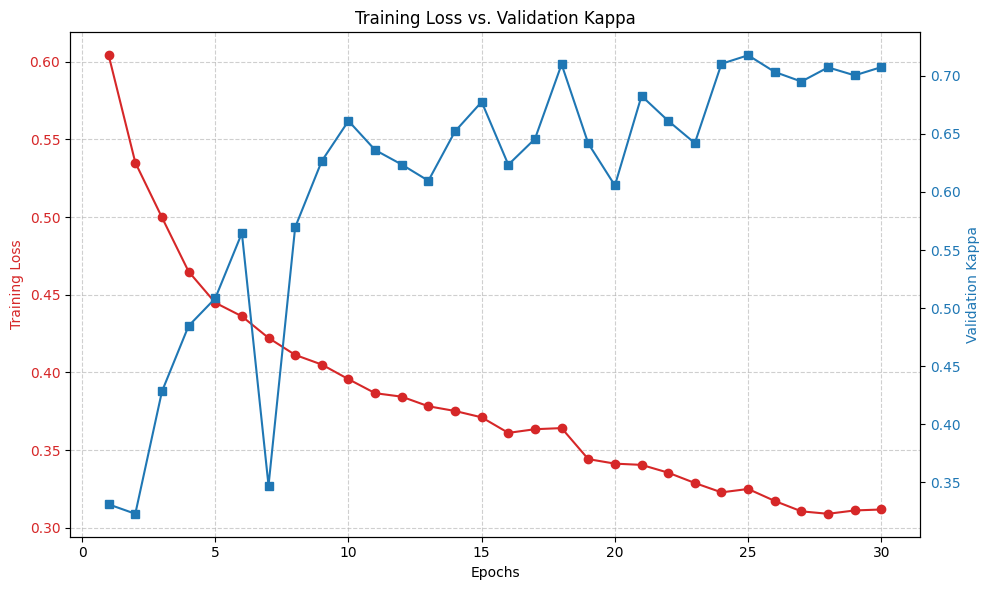

In [8]:
def plot_training_results(history):
    epochs = range(1, len(history) + 1)
    train_loss = [h['train_loss'] for h in history]
    val_kappa = [h['val_kappa'] for h in history]

    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot Loss 
    color = 'tab:red'
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Training Loss', color=color)
    ax1.plot(epochs, train_loss, color=color, marker='o', label='Train Loss')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.grid(True, linestyle='--', alpha=0.6)

    # Plot Kappa on the same chart (Secondary Axis) 
    ax2 = ax1.twinx() 
    color = 'tab:blue'
    ax2.set_ylabel('Validation Kappa', color=color)
    ax2.plot(epochs, val_kappa, color=color, marker='s', label='Val Kappa')
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title('Training Loss vs. Validation Kappa')
    fig.tight_layout()
    plt.savefig('learning_curves.png')
    plt.show()

plot_training_results(history)

In [9]:
def final_evaluation(model, val_loader, device, thresholds=None):
    model.load_state_dict(torch.load("best_custom_dr_model.pth"))
    model.eval()
    
    all_preds, all_labs = [], []
    all_logits = []

    # Collect Logits/Probs
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Final Evaluation"):
            images = images.to(device)
            with torch.amp.autocast(device_type=DEVICE.type):
                logits = model(images)
                # We work with Sigmoid for ordinal regression
                probs = torch.sigmoid(logits)
                
            all_logits.append(probs.cpu())
            all_labs.extend(labels.cpu().numpy())
    
    all_logits = torch.cat(all_logits, dim=0)
    
    # Decision Logic (Standard vs Optimized)
    if thresholds is None:
        print("\nRUNNING RAW EVALUATION (Standard 0.5 Thresholds)... ")
        # Standard ordinal_to_label logic
        all_preds = (all_logits > 0.5).sum(dim=1).numpy()
    else:
        print(f"\nRUNNING OPTIMIZED EVALUATION (Custom Thresholds)... ")
        print(f"Thresholds: {[round(t, 4) for t in thresholds]}")
        # Optimized 
        all_preds = (all_logits > torch.tensor(thresholds)).sum(axis=1).numpy()

    # Metrics & Reporting
    classes = ["No DR", "Mild", "Moderate", "Severe", "Proliferative"]
    
    # Metrics
    acc = accuracy_score(all_labs, all_preds)
    bal_acc = balanced_accuracy_score(all_labs, all_preds)
    kappa = cohen_kappa_score(all_labs, all_preds, weights='quadratic')
    
    print("\nDetailed Classification Report:")
    print(classification_report(all_labs, all_preds, target_names=classes, zero_division=0))

    print(f"Overall Accuracy:   {acc:.4f}")
    print(f"Balanced Accuracy:  {bal_acc:.4f}")
    print(f"Quadratic Kappa:    {kappa:.4f}")
    
    # Confusion Matrix
    cm = confusion_matrix(all_labs, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(f'Confusion Matrix (Kappa: {kappa:.4f})')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


Final Evaluation: 100%|██████████| 220/220 [00:48<00:00,  4.51it/s]



RUNNING RAW EVALUATION (Standard 0.5 Thresholds)... 

Detailed Classification Report:
               precision    recall  f1-score   support

        No DR       0.88      0.86      0.87      5162
         Mild       0.13      0.22      0.16       489
     Moderate       0.61      0.48      0.54      1058
       Severe       0.39      0.53      0.45       175
Proliferative       0.67      0.51      0.58       142

     accuracy                           0.74      7026
    macro avg       0.54      0.52      0.52      7026
 weighted avg       0.77      0.74      0.76      7026

Overall Accuracy:   0.7434
Balanced Accuracy:  0.5196
Quadratic Kappa:    0.7177


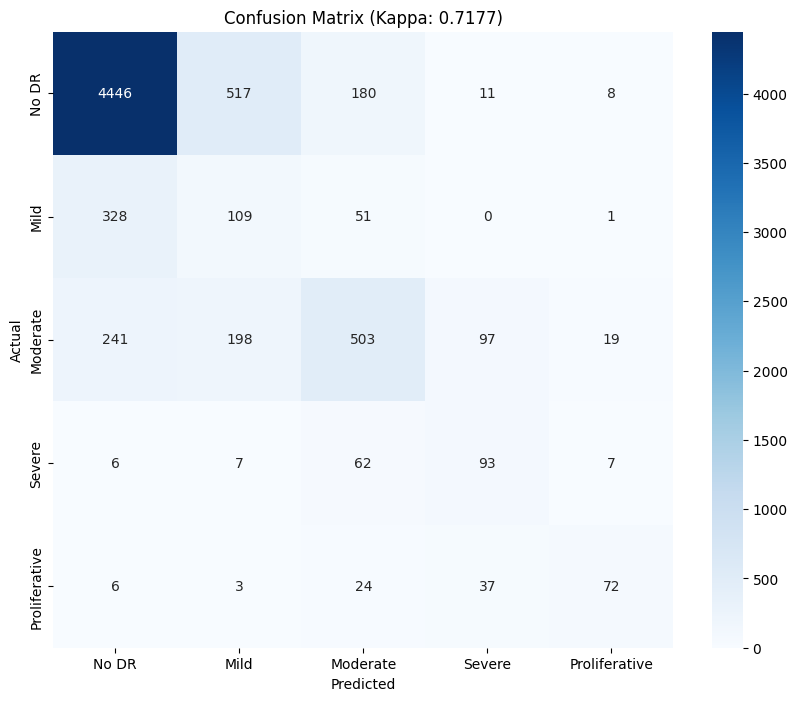

In [10]:
final_evaluation(model, val_loader, DEVICE, thresholds=None)

### Model Threshold Optimization 

In [11]:
from scipy.optimize import minimize

def optimize_thresholds(model, val_loader, device):
    model.eval()
    all_logits = []
    all_targets = []

    print("Extracting Logits for Calibration...")
    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            with torch.amp.autocast('cuda'):
                logits = model(images.to(device))
            all_logits.append(logits.cpu().numpy())
            all_targets.append(labels.numpy())

    all_logits = np.concatenate(all_logits)
    all_targets = np.concatenate(all_targets)

    # The Objective: Maximize Kappa (Minimize -Kappa)
    def kappa_objective(thresholds):
        probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
        preds = (probs > thresholds).sum(axis=1)
        # return negative. "minimize" looks for the lowest value
        return -cohen_kappa_score(all_targets, preds, weights='quadratic')

    print("Searching for Optimal Thresholds...")
    initial_thresholds = [0.5, 0.5, 0.5, 0.5]
    res = minimize(kappa_objective, initial_thresholds, method='Nelder-Mead')
    
    best_thresholds = res.x
    best_kappa = -res.fun
    
    print("\n" + "="*40)
    print(f"Base Kappa (0.5): {-kappa_objective([0.5]*4):.4f}")
    print(f"Optimized Kappa:  {best_kappa:.4f}")
    print(f"Best Thresholds:  {best_thresholds}")
    print("="*40)
    
    return best_thresholds

### Optimized Threshold Model Evaluation

Extracting Logits for Calibration...


100%|██████████| 220/220 [00:48<00:00,  4.50it/s]
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: Runt

Searching for Optimal Thresholds...


/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 1 / (1 + np.exp(-all_logits)) # Sigmoid
/tmp/ipykernel_23/3831793831.py:21: RuntimeWarning: overflow encountered in exp
  probs = 


Base Kappa (0.5): 0.7177
Optimized Kappa:  0.7283
Best Thresholds:  [0.59309619 0.60869568 0.35683024 0.49104884]
Best thresholds found for maximum kappa [0.59309619 0.60869568 0.35683024 0.49104884]


Final Evaluation: 100%|██████████| 220/220 [00:48<00:00,  4.52it/s]



RUNNING OPTIMIZED EVALUATION (Custom Thresholds)... 
Thresholds: [np.float64(0.5931), np.float64(0.6087), np.float64(0.3568), np.float64(0.491)]

Detailed Classification Report:
               precision    recall  f1-score   support

        No DR       0.87      0.92      0.89      5162
         Mild       0.12      0.15      0.14       489
     Moderate       0.67      0.34      0.45      1058
       Severe       0.34      0.65      0.44       175
Proliferative       0.67      0.51      0.58       142

     accuracy                           0.76      7026
    macro avg       0.53      0.52      0.50      7026
 weighted avg       0.77      0.76      0.76      7026

Overall Accuracy:   0.7629
Balanced Accuracy:  0.5153
Quadratic Kappa:    0.7282


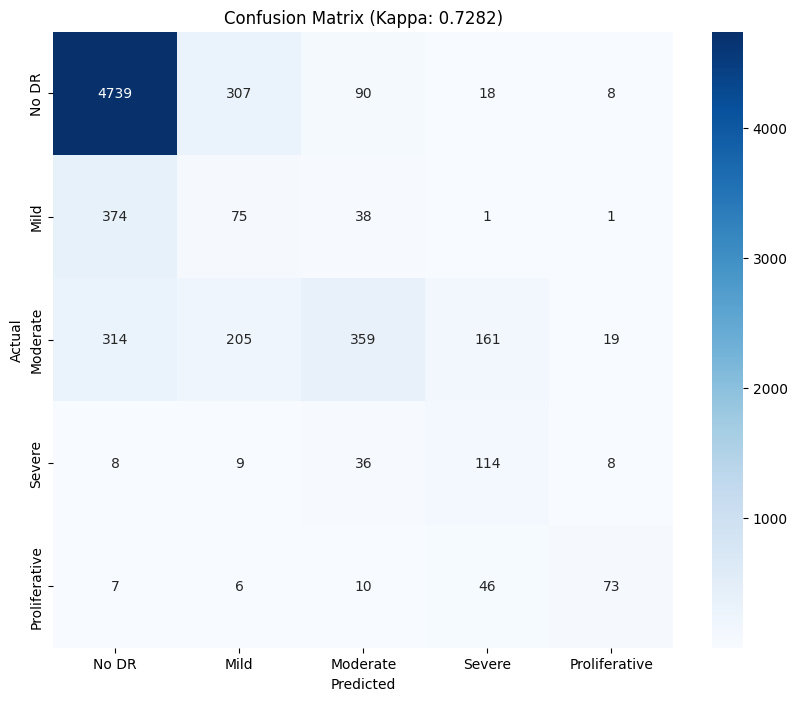

In [12]:
best_thresholds = optimize_thresholds(model, val_loader, DEVICE)
print("Best thresholds found for maximum kappa", best_thresholds)
final_evaluation(model, val_loader, DEVICE, thresholds=best_thresholds)

# Grad Cam

In [13]:
!pip install -q grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 36.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [14]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

def plot_gradcam(img_path, actual_label, model, transform, thresholds):
    model.eval()
    
    # 1. Preprocess
    img_pil = Image.open(img_path).convert('RGB')
    img_np_orig = np.array(img_pil)
    img_resized = cv2.resize(img_np_orig, (512, 512))
    input_tensor = transform(image=img_resized)['image'].unsqueeze(0).to(DEVICE)
    
    # 2. Get Prediction using OPTIMIZED thresholds
    with torch.no_grad():
        logits = model(input_tensor)
        probs = torch.sigmoid(logits)
        # Apply the specific thresholds found by your optimization function
        thresh_tensor = torch.tensor(thresholds).to(DEVICE)
        pred = (probs > thresh_tensor).sum(dim=1).item()
    
    # 3. Target the most relevant gate for that prediction
    target_idx = max(0, min(3, pred - 1)) if pred > 0 else 0
    
    # 4. Setup Grad-CAM (Targeting the last BatchNorm of the last layer)
    target_layers = [model.layer4[-1].bn2] 
    
    with GradCAM(model=model, target_layers=target_layers) as cam:
        targets = [ClassifierOutputTarget(target_idx)]
        grayscale_cam = cam(input_tensor=input_tensor, 
                            targets=targets,
                            aug_smooth=True, 
                            eigen_smooth=True)[0, :]
        
        visualization = show_cam_on_image(img_resized/255.0, grayscale_cam, use_rgb=True)
        
    # 5. Plot
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img_resized)
    plt.title(f"Actual: {actual_label}\n(Raw Image)", fontsize=10)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(visualization)
    # Highlight that this is the OPTIMIZED prediction
    plt.title(f"Optimized Prediction: Class {pred}\n(Focusing on Gate {target_idx})", fontsize=10, color='green')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()


model.load_state_dict(torch.load("best_custom_dr_model.pth"))
model.to(DEVICE)

# Find one sample for each class
class_samples = {}
for path, label in val_dataset.samples:
    if label not in class_samples:
        class_samples[label] = path
    if len(class_samples) == 5:
        break
        


Running Grad-CAM Audit: Standard 0.5 Thresholds

 Visualizing Actual Class: 0 


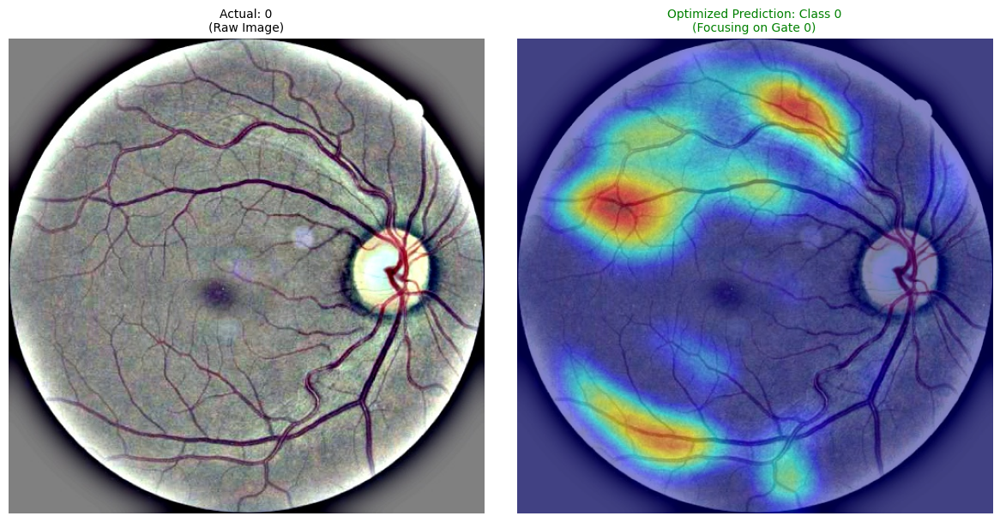


 Visualizing Actual Class: 1 


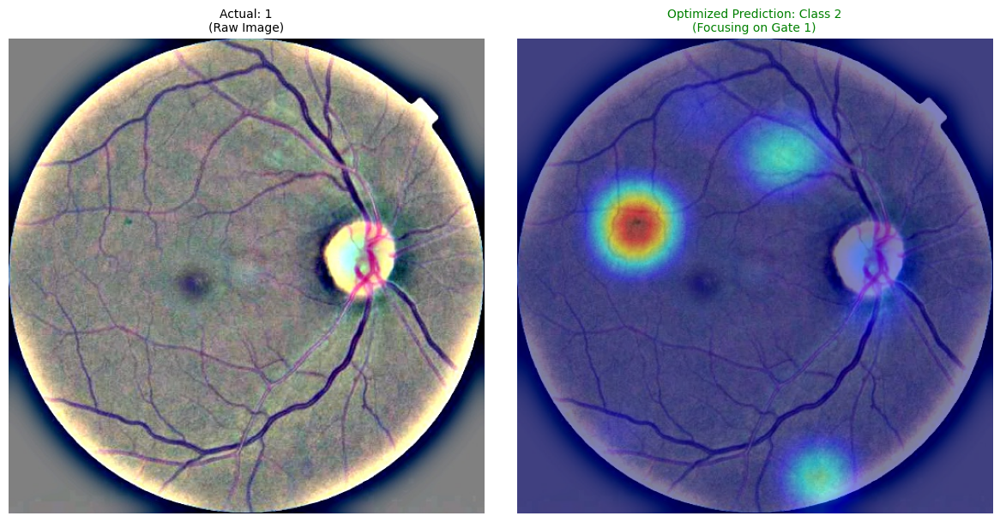


 Visualizing Actual Class: 2 


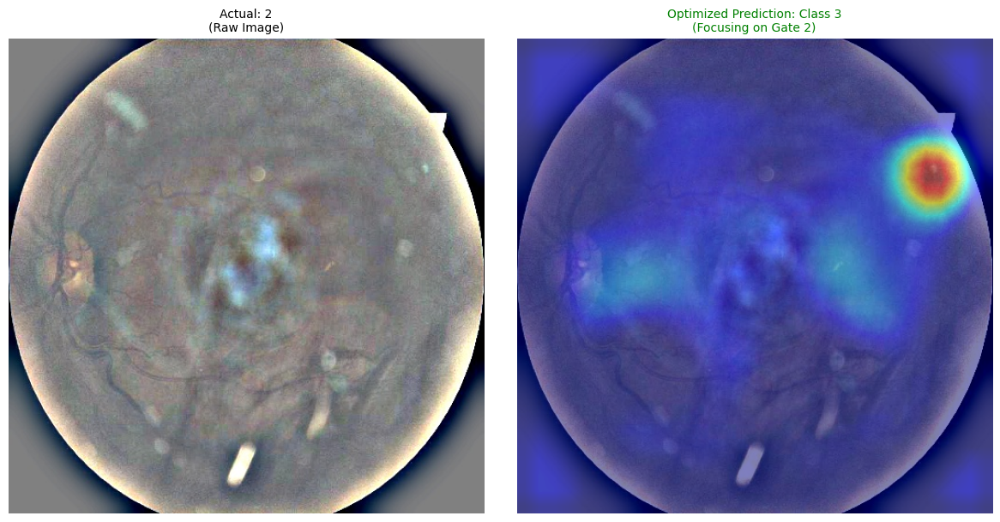


 Visualizing Actual Class: 3 


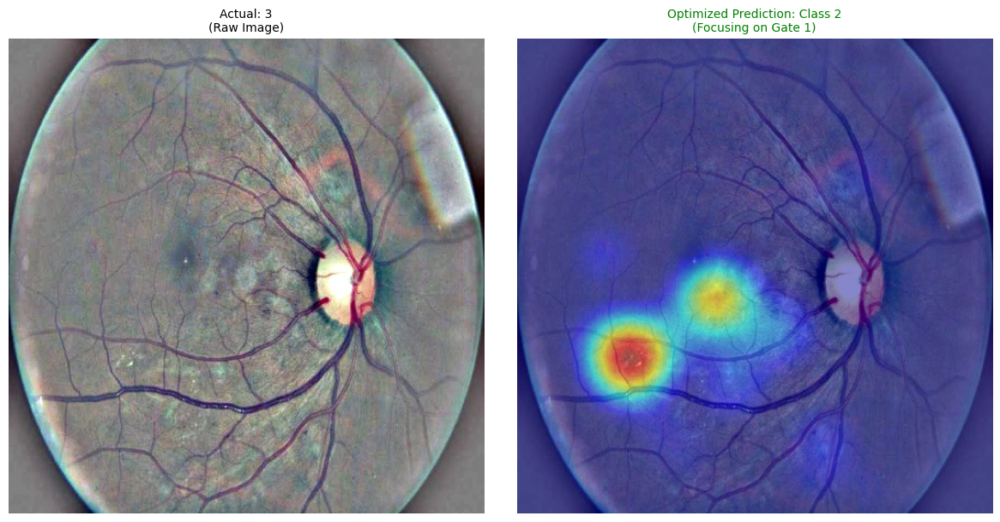


 Visualizing Actual Class: 4 


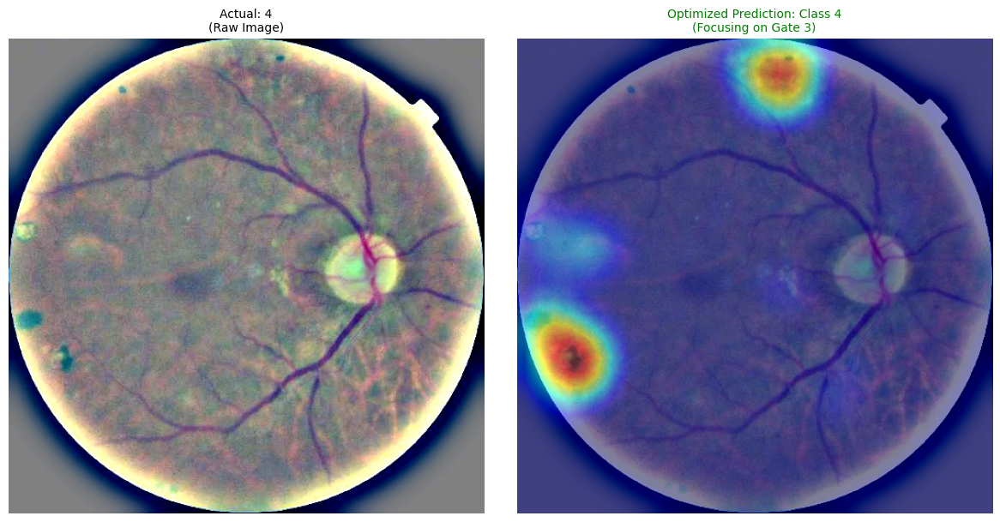

In [15]:
# Unoptimized (Standard 0.5) 
print("Running Grad-CAM Audit: Standard 0.5 Thresholds")
standard_thresholds = [0.5, 0.5, 0.5, 0.5]

for label in sorted(class_samples.keys()):
    img_path = class_samples[label]
    print(f"\n Visualizing Actual Class: {label} ")
    plot_gradcam(img_path, label, model, val_transform, standard_thresholds)

Running Grad-CAM Audit: Optimized Thresholds [0.59309619 0.60869568 0.35683024 0.49104884]

 Visualizing Actual Class: 0 


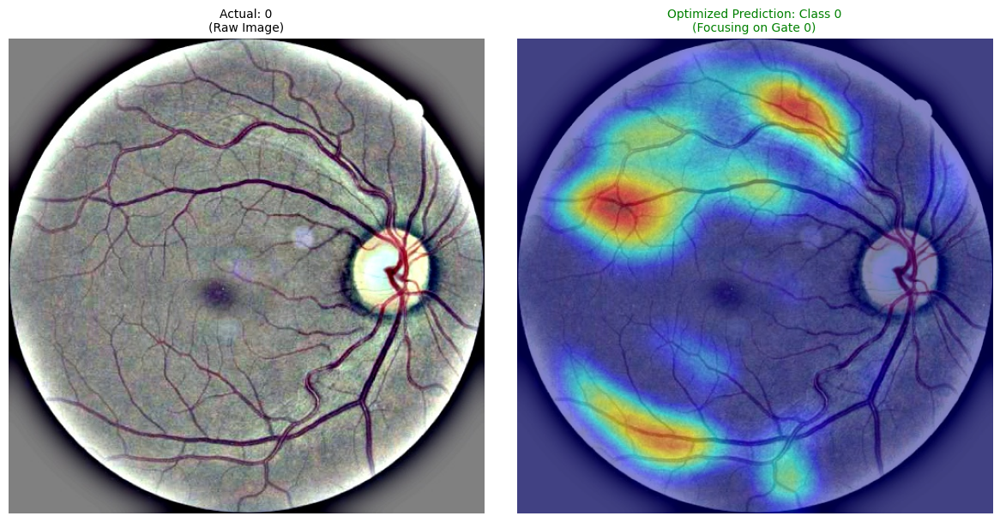


 Visualizing Actual Class: 1 


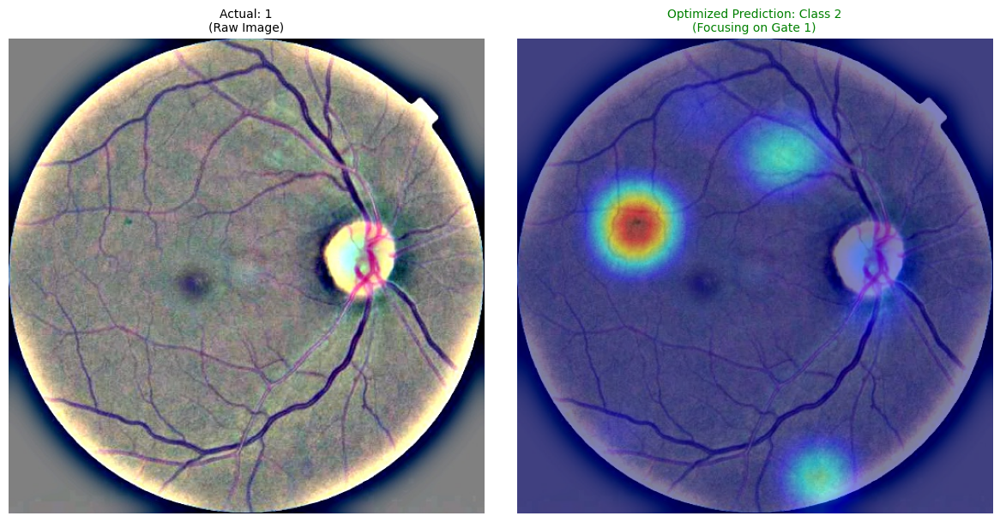


 Visualizing Actual Class: 2 


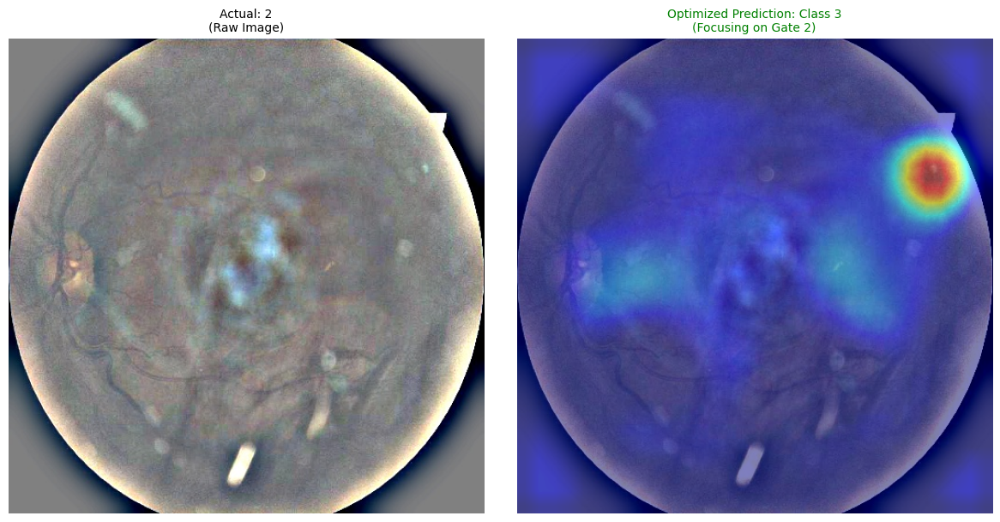


 Visualizing Actual Class: 3 


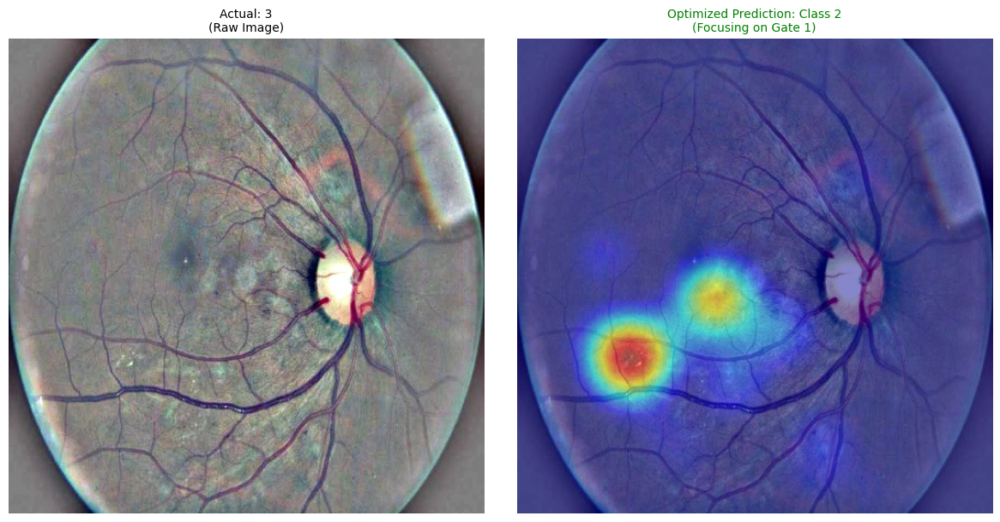


 Visualizing Actual Class: 4 


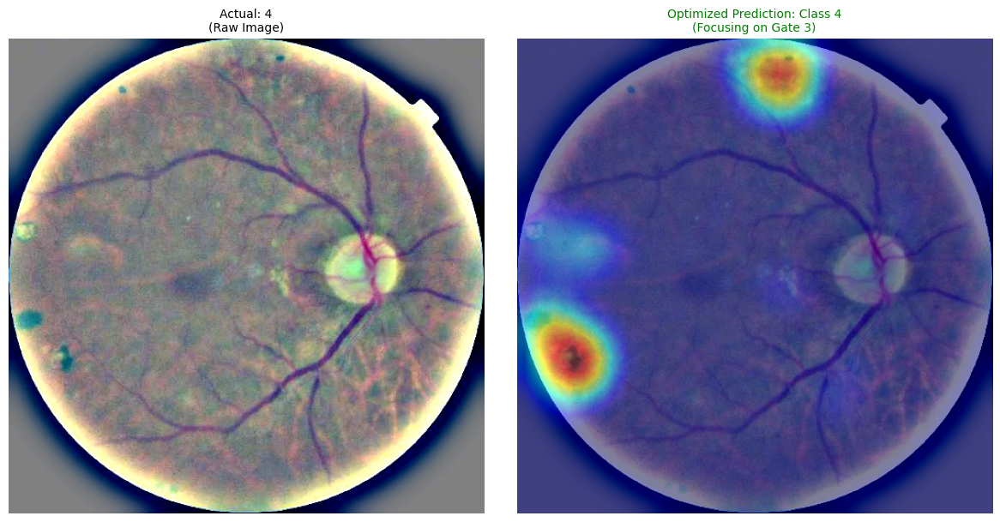

In [16]:
# Optimized (Best Kappa) 
print(f"Running Grad-CAM Audit: Optimized Thresholds {best_thresholds}")

for label in sorted(class_samples.keys()):
    img_path = class_samples[label]
    print(f"\n Visualizing Actual Class: {label} ")
    plot_gradcam(img_path, label, model, val_transform, best_thresholds)